Tutorial Code by Amirhossein Ahrari
YouTube: https://www.youtube.com/@amirhosseinahrarigee
Tutorial Video: Google Earth Engine Tutorial-185: Temporal Aggregation in Python

This code is part of a tutorial series on Earth Engine programming techniques
presented on the Amirhossein Ahrari YouTube channel. You are free to use and modify
this code for academic and non-academic purposes. Don't forget to subscribe to
the Amirhossein Ahrari channel and follow the videos to support the instructor

In [ ]:
!pip install --upgrade xee
!pip install -U geemap

In [2]:
import ee

In [3]:
ee.Authenticate()
ee.Initialize(
    project = 'ee-amirhosseinahrari',
    opt_url = 'https://earthengine-highvolume.googleapis.com'
)

In [4]:
import geemap

In [5]:
map = geemap.Map()
map

Map(center=[0, 0], controls=(WidgetControl(options=['position', 'transparent_bg'], position='topright', transp…

In [6]:
roi = map.draw_last_feature.geometry()
roi

ee.Geometry({
  "functionInvocationValue": {
    "functionName": "Feature.geometry",
    "arguments": {
      "feature": {
        "functionInvocationValue": {
          "functionName": "Feature",
          "arguments": {
            "geometry": {
              "functionInvocationValue": {
                "functionName": "GeometryConstructors.Polygon",
                "arguments": {
                  "coordinates": {
                    "constantValue": [
                      [
                        [
                          43.763906,
                          22.511634
                        ],
                        [
                          43.763906,
                          40.278764
                        ],
                        [
                          63.663573,
                          40.278764
                        ],
                        [
                          63.663573,
                          22.511634
                        ],
                        [
                          43.763906,
                          22.511634
                        ]
                      ]
                    ]
                  },
                  "geodesic": {
                    "constantValue": false
                  }
                }
              }
            }
          }
        }
      }
    }
  }
})

In [7]:
pr = (
    ee.ImageCollection("NOAA/PERSIANN-CDR")
    .filterDate('2015','2024')
)

pr

In [8]:
import xarray as xr

In [9]:
ds = xr.open_dataset(
    pr,
    engine = 'ee',
    crs = 'EPSG:4326',
    scale = 0.3,
    geometry = roi
)

In [11]:
ds = ds.sortby('time') * 1

In [12]:
ds

<xarray.Dataset> Size: 51MB
Dimensions:        (time: 3286, lon: 66, lat: 59)
Coordinates:
  * time           (time) datetime64[ns] 26kB 2015-01-01 ... 2023-12-31
  * lon            (lon) float64 528B 43.91 44.21 44.51 ... 62.81 63.11 63.41
  * lat            (lat) float64 472B 22.66 22.96 23.26 ... 39.46 39.76 40.06
Data variables:
    precipitation  (time, lon, lat) float32 51MB 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0
Attributes: (12/20)
    date_range:               [410227200000, 1625011200000]
    description:              <p>PERSIANN-CDR is a daily quasi-global precipi...
    keywords:                 ['cdr', 'climate', 'geophysical', 'ncdc', 'noaa...
    period:                   1
    period_mapping:           [410227200000, 1625011200000]
    product_tags:             ['precipitation', 'persiann', 'geophysical', 'w...
    ...                       ...
    visualization_0_bands:    precipitation
    visualization_0_max:      50.0
    visualization_0_min:      0.0
    visualization_0_name:     Precipitation
    visualization_0_palette:  3907ff,03fff3,28ff25,fbff09,ff1105
    crs:                      EPSG:4326

In [13]:
ds_monthly = ds.resample(time = 'M').sum('time')

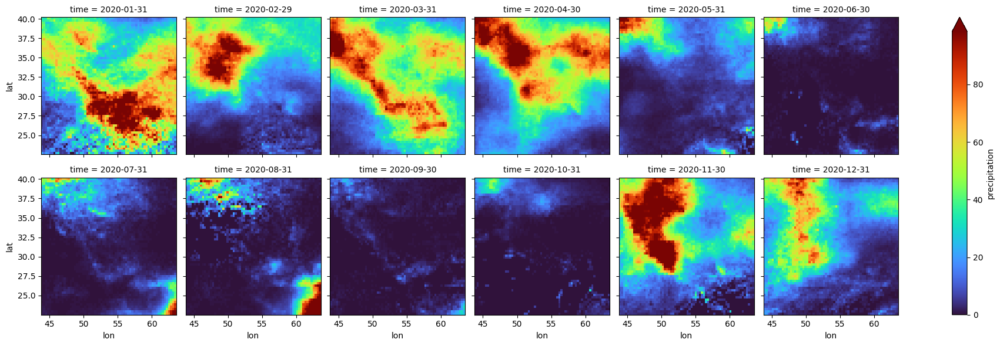

In [18]:
ds_monthly.sel(time = '2020').precipitation.plot(
    x = 'lon', y = 'lat', col = 'time', robust = True, col_wrap = 6, cmap = 'turbo'
)

In [19]:
ds_weekly = ds.resample(time = 'W').sum('time')
ds_weekly

<xarray.Dataset> Size: 7MB
Dimensions:        (time: 470, lon: 66, lat: 59)
Coordinates:
  * time           (time) datetime64[ns] 4kB 2015-01-04 ... 2023-12-31
  * lon            (lon) float64 528B 43.91 44.21 44.51 ... 62.81 63.11 63.41
  * lat            (lat) float64 472B 22.66 22.96 23.26 ... 39.46 39.76 40.06
Data variables:
    precipitation  (time, lon, lat) float32 7MB 0.0 0.0 0.0 ... 0.9548 1.088
Attributes: (12/20)
    date_range:               [410227200000, 1625011200000]
    description:              <p>PERSIANN-CDR is a daily quasi-global precipi...
    keywords:                 ['cdr', 'climate', 'geophysical', 'ncdc', 'noaa...
    period:                   1
    period_mapping:           [410227200000, 1625011200000]
    product_tags:             ['precipitation', 'persiann', 'geophysical', 'w...
    ...                       ...
    visualization_0_bands:    precipitation
    visualization_0_max:      50.0
    visualization_0_min:      0.0
    visualization_0_name:     Precipitation
    visualization_0_palette:  3907ff,03fff3,28ff25,fbff09,ff1105
    crs:                      EPSG:4326

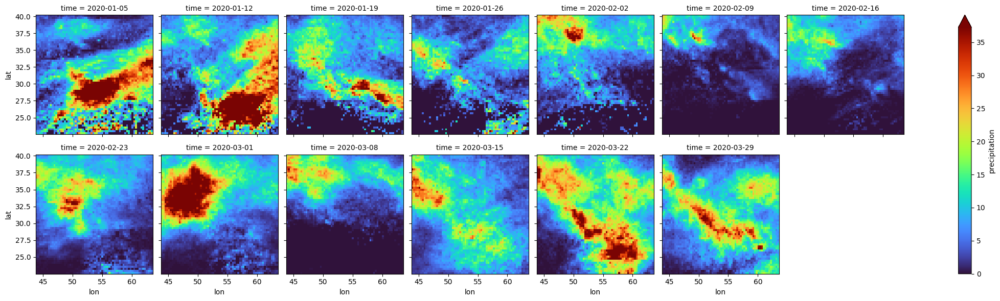

In [21]:
ds_weekly.sel(time = slice('2020-01','2020-03')).precipitation.plot(
    x = 'lon', y = 'lat', col = 'time', robust = True, col_wrap = 7, cmap = 'turbo'
)

In [24]:
ds_3days = ds.resample(time = '3D').sum('time')
mean_3days = ds_3days.mean(dim = ['lon','lat']).to_dataframe().precipitation

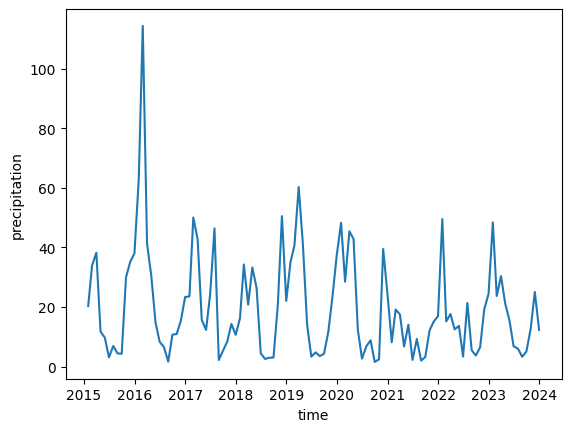

In [27]:
ds_monthly.mean(dim = ['lon','lat']).precipitation.plot()

<Axes: xlabel='time'>

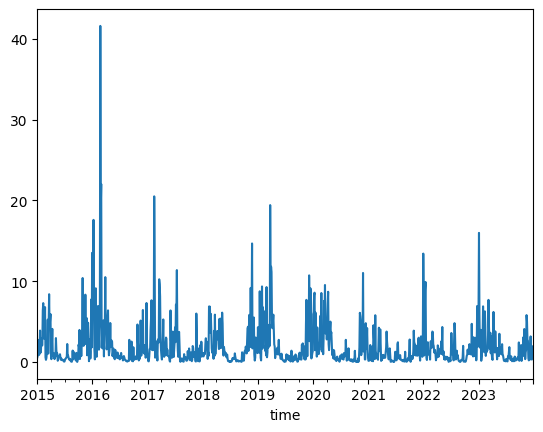

In [26]:
mean_3days.plot()

In [28]:
ds_yearly = ds.resample(time = 'YE').sum('time')

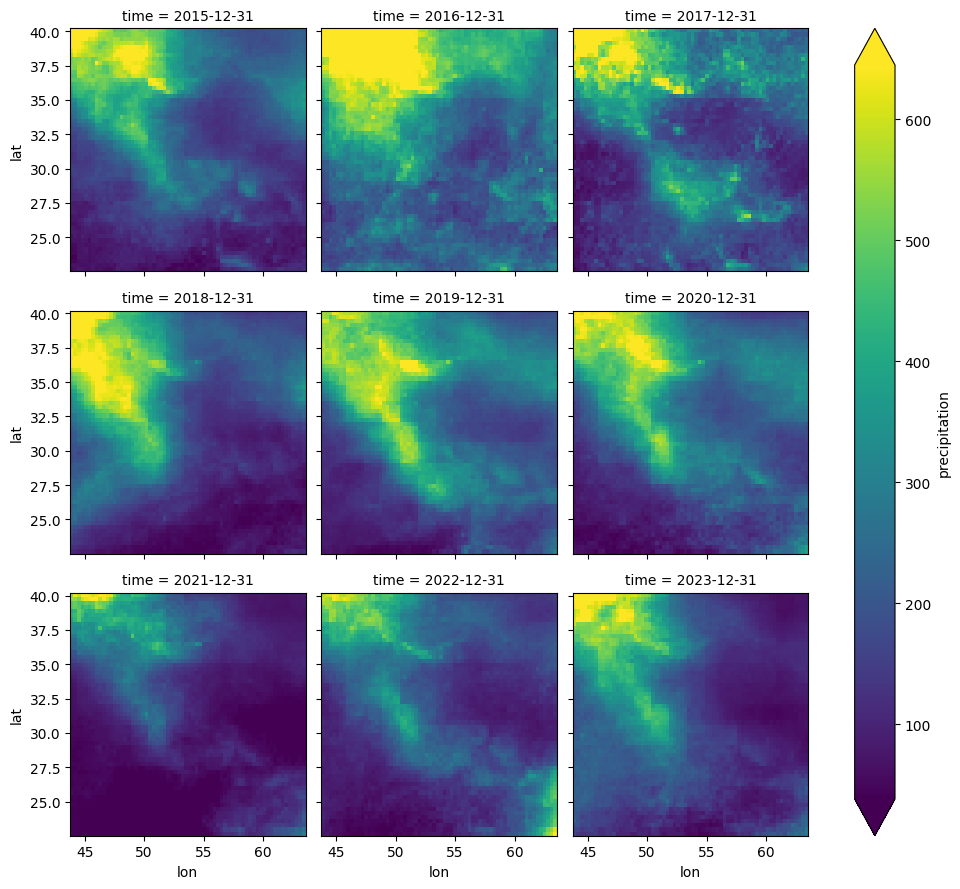

In [30]:
ds_yearly.precipitation.plot(
    x = 'lon', y = 'lat', col = 'time', col_wrap = 3, robust = True
)

In [37]:
ds_month = ds_monthly.groupby('time.month').mean('time')

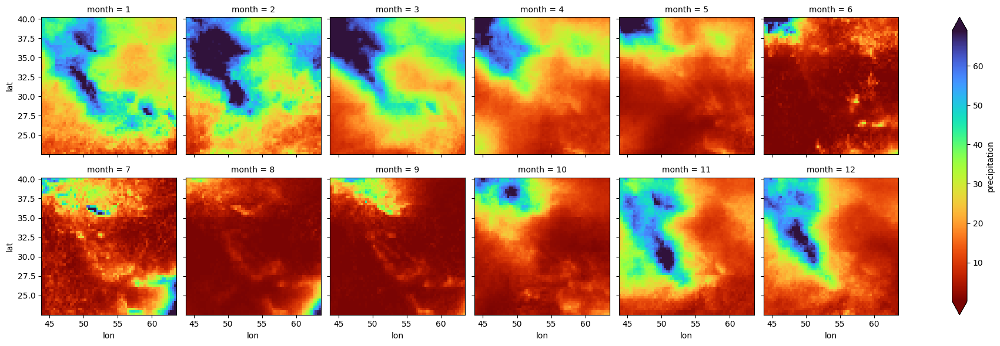

In [39]:
ds_month.precipitation.plot(
    x = 'lon', y = 'lat', col = 'month', col_wrap = 6, robust = True, cmap = 'turbo_r'
)

<Axes: xlabel='month'>

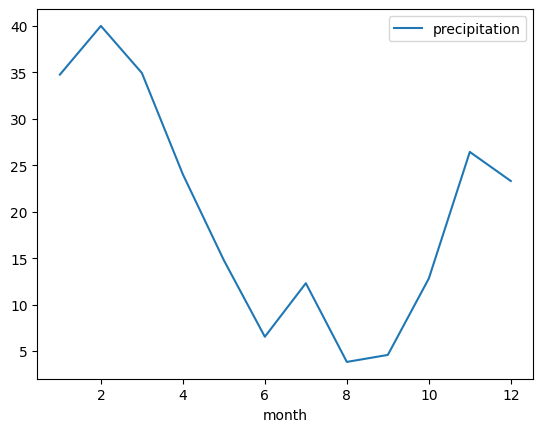

In [41]:
ds_month.mean(dim = ['lon','lat']).to_dataframe().plot()